# NOB, FITE, TUT Bond Futures Spreads

Author: Mark Black

Date: 6/8/2017

In this research notebook we explore the 3 different bond future spreads: NOB FITE TUT
Each of the spreads is specific  strategy on trading parts of the yield curve either flattening or steepening.

Below is a breakdown of each spread

    - NOB: 3:1 ratio of TNote 10 yr : TBond 30 yr (TY : US)
    - FITE: 3:2 ratio of TNote 5 yr : TNote 10 yr (FV : TY)
    - TUT: 1:1 ratio of TNote 2 yr : TNote 10 yr (TU : TY)
    
We will start with the NOB Spread

In [1]:
# Import necessary libraries
import numpy as np
import pandas as pd
import scipy as sp
import statsmodels.api as sm
import talib
from statsmodels.tsa.stattools import coint, adfuller

import matplotlib.pyplot as plt
from quantopian.research.experimental import continuous_future, history

### NOB Spread

The "NOB" Spread is the difference between the 10 & 30 yr UST that is a binary trade where a trader is betting that the yield curve will flatten or steepen. 

The default proportion is a 3:1 (TY:US)

- If you believe that the yield curve will steepen you buy the back 30 yr UST and sell the front 10 yr UST in a -2:3 ratio.

- If you believe that the yield curve will flatten you buy the front 10 yr UST and sell the  back 30 yr contracts in a 3:-2 ratio.

https://www.tastytrade.com/tt/shows/futures-measures/episodes/nob-spread-notes-over-bonds-spread-06-17-2015

In [3]:
ty_future = continuous_future('TY', offset=0, roll='calendar', adjustment='mul')
ty_prices = history(ty_future, fields='price', start_date='2007-01-01', end_date='2017-05-01')
ty_prices.name = ty_future.root_symbol

zn_future = continuous_future('US', offset=0, roll='calendar', adjustment='mul')
zn_prices = history(zn_future, fields='price', start_date='2007-01-01', end_date='2017-05-01')
zn_prices.name = zn_future.root_symbol

nob = pd.concat([ty_prices, zn_prices], axis=1)
nob = nob.dropna()
nob.head()

,TY,US
2007-01-02 00:00:00+00:00,79.497,91.534
2007-01-03 00:00:00+00:00,79.624,91.739
2007-01-04 00:00:00+00:00,79.924,92.200
2007-01-05 00:00:00+00:00,79.716,91.892
2007-01-08 00:00:00+00:00,79.693,91.892


In [84]:
# NOB column calculation
nob['NOB'] = ty_prices / zn_prices
# NOB RSI 14 column
nob['RSI14'] = talib.RSI(nob.NOB, timeperiod=14)
nob['RSI5'] = talib.RSI(nob.NOB, timeperiod=5)

#rsi_df = pd.DataFrame(rsi).dropna()

Now we employ the eyeball test to see if there a possible trading strategy using RSI 14

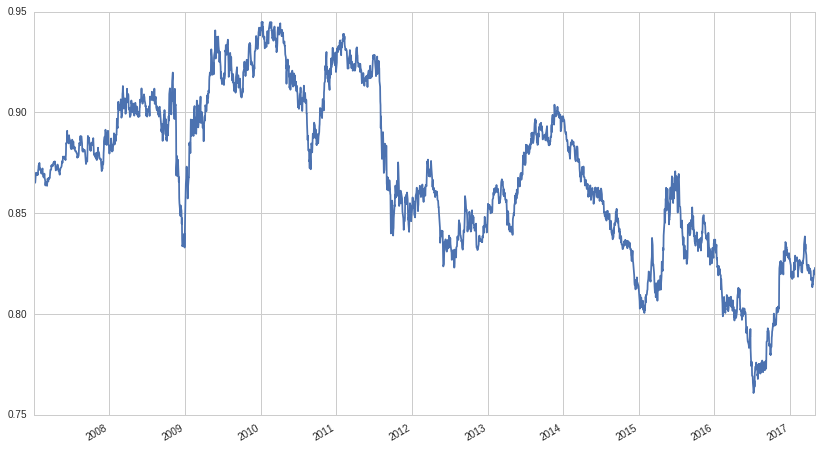

In [85]:
nob['NOB'].plot()
#plt.legend();
#plt.ylabel('NOB Spread')
#data2

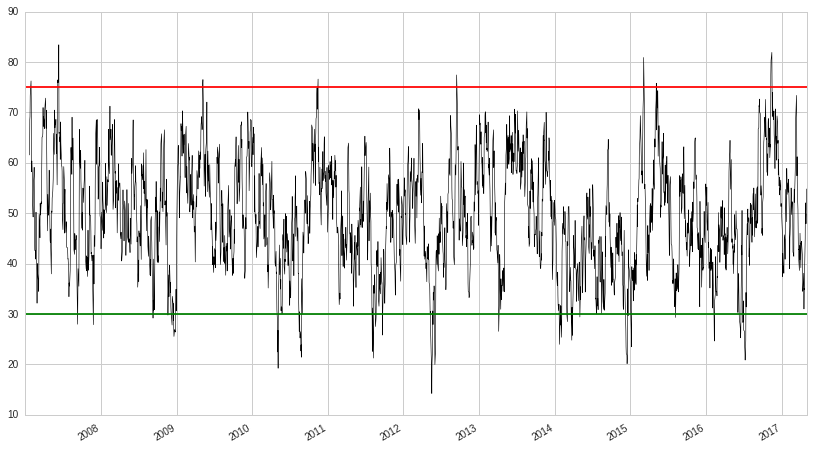

In [93]:
nob['RSI14'].plot(color='black', linewidth=.6)
plt.axhline(y=75, xmin=0, xmax=1, hold=None, color='red')
plt.axhline(y=30, xmin=0, xmax=1, hold=None, color='green')

The eyeball test for RSI 5

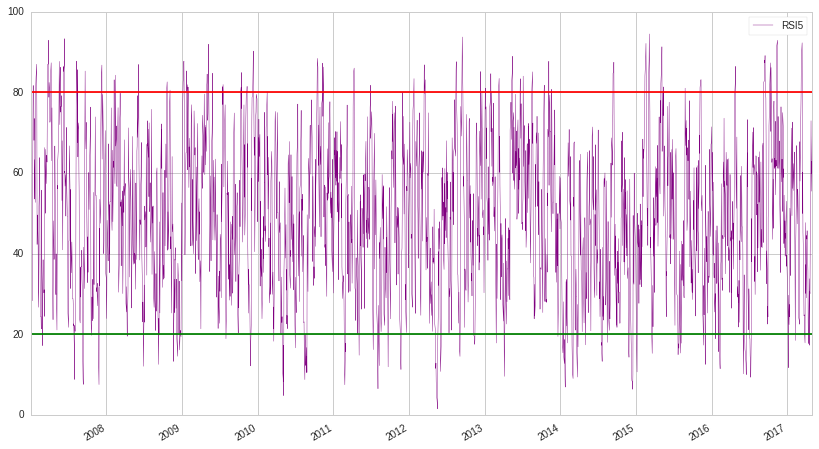

In [87]:
#nob['NOB'].plot()
nob['RSI5'].plot(color='purple', linewidth=.4)
plt.axhline(y=80, xmin=0, xmax=1, hold=None, color='red')
plt.axhline(y=20, xmin=0, xmax=1, hold=None, color='green')
plt.legend();

Now it's time to take the NOB RSI spread to the backtesting algorithm stage. 

In [96]:
# RSI_14 30/75
# with leverage -.4/6 ratio
nob_rsi14_bt = get_backtest('5939e5c9f4c4366a0bf43345')

100% Time: 0:00:01|###########################################################|


In [97]:
# RSI 15/85
# with leverage -.4/6 ratio
nob_rsi5_bt = get_backtest('5939e03d2ca2af6e3dcf335b')

100% Time: 0:00:01|###########################################################|


Entire data start date: 2007-09-03
Entire data end date: 2016-09-30


Backtest Months: 111


Performance statistics,Backtest
annual_return,0.10
cum_returns_final,1.37
annual_volatility,0.16
sharpe_ratio,0.66
calmar_ratio,0.41
stability_of_timeseries,0.90
max_drawdown,-0.24
omega_ratio,1.12
sortino_ratio,0.97
skew,0.26


Worst drawdown periods,net drawdown in %,peak date,valley date,recovery date,duration
0,23.87,2008-12-18,2009-06-10,2010-10-06,470
1,20.44,2012-07-24,2013-09-05,2014-10-15,582
2,16.99,2010-10-06,2011-02-08,2011-07-29,213
3,12.84,2008-09-15,2008-10-17,2008-11-19,48
4,12.53,2015-01-30,2015-06-10,2016-02-02,263




[-0.02  -0.039]


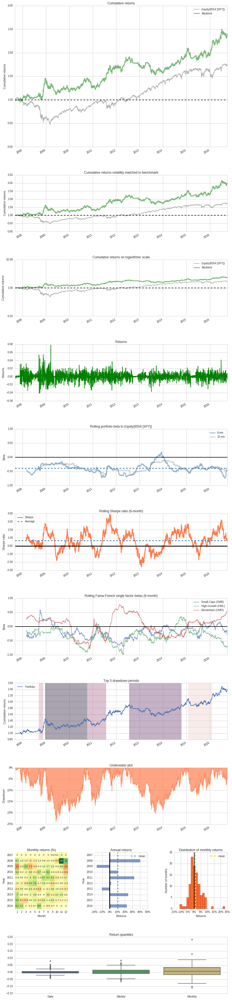

Stress Events,mean,min,max
Lehmann,0.07%,-4.18%,5.37%
US downgrade/European Debt Crisis,0.33%,-1.22%,2.54%
Fukushima,-0.05%,-1.29%,1.88%
EZB IR Event,-0.14%,-1.77%,0.46%
Mar08,-0.03%,-3.51%,2.34%
Sept08,0.07%,-4.18%,5.37%
2009Q1,-0.31%,-3.17%,3.26%
2009Q2,-0.10%,-2.85%,7.83%
Flash Crash,0.01%,-0.38%,0.74%
Apr14,0.12%,-1.34%,1.35%


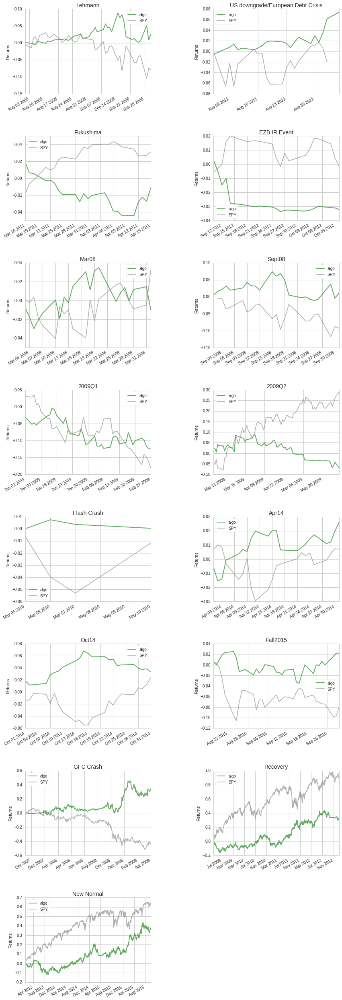

Top 10 long positions of all time,max
TYU13-1020201309,0.11%
TYZ10-1020201012,0.11%
TYH10-1020201003,0.11%
USH10-1022201003,0.11%
TYU10-1020201009,0.11%
TYH11-1020201103,0.11%
TYZ15-1020201512,0.11%
USH08-1022200803,0.11%
USH11-1022201103,0.11%
TYZ14-1020201412,0.11%


Top 10 short positions of all time,max
TYZ07-1020200712,-0.05%
USM15-1022201506,-0.04%
USZ12-1022201212,-0.04%
TYU11-1020201109,-0.04%
USM09-1022200906,-0.04%
TYH16-1020201603,-0.04%
TYM10-1020201006,-0.04%
TYM13-1020201306,-0.04%
USZ10-1022201012,-0.04%


Top 10 positions of all time,max
TYU13-1020201309,0.11%
TYZ10-1020201012,0.11%
TYH10-1020201003,0.11%
USH10-1022201003,0.11%
TYU10-1020201009,0.11%
TYH11-1020201103,0.11%
TYZ15-1020201512,0.11%
USH08-1022200803,0.11%
USH11-1022201103,0.11%
TYZ14-1020201412,0.11%


All positions ever held,max
TYU13-1020201309,0.11%
TYZ10-1020201012,0.11%
TYH10-1020201003,0.11%
USH10-1022201003,0.11%
TYU10-1020201009,0.11%
TYH11-1020201103,0.11%
TYZ15-1020201512,0.11%
USH08-1022200803,0.11%
USH11-1022201103,0.11%
TYZ14-1020201412,0.11%


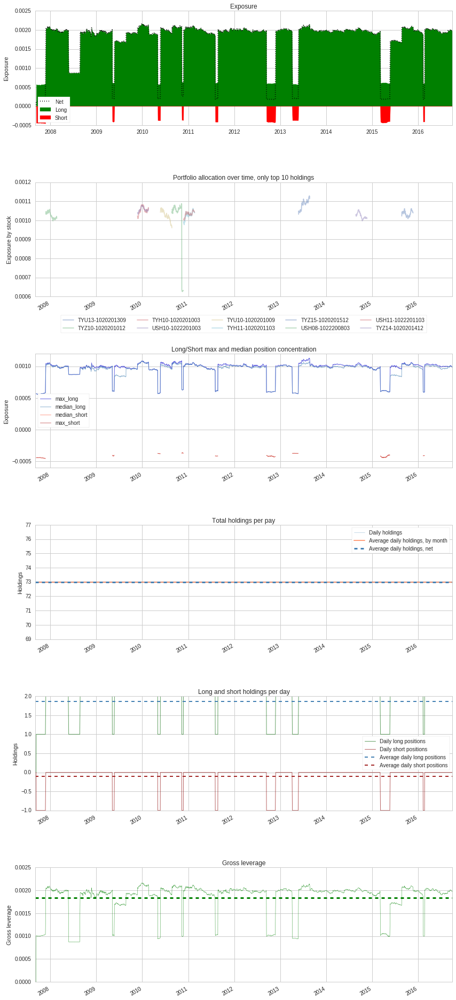

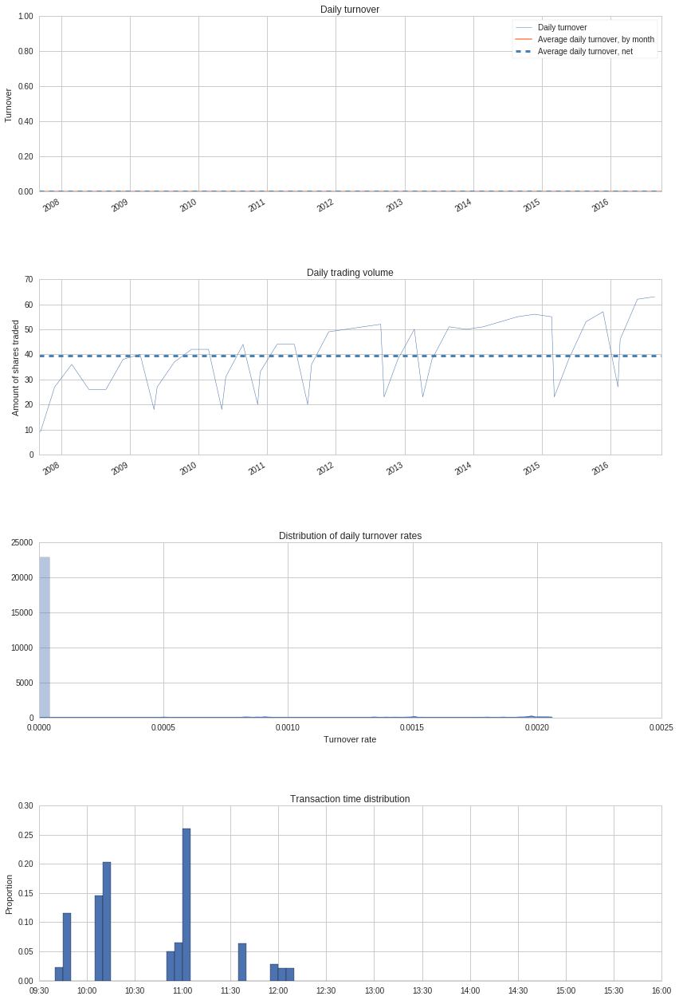

In [98]:
nob_rsi14_bt.create_full_tear_sheet()

Entire data start date: 2007-05-07
Entire data end date: 2016-05-10


Backtest Months: 110


Performance statistics,Backtest
annual_return,0.08
cum_returns_final,0.98
annual_volatility,0.14
sharpe_ratio,0.58
calmar_ratio,0.36
stability_of_timeseries,0.81
max_drawdown,-0.21
omega_ratio,1.11
sortino_ratio,0.85
skew,0.22


Worst drawdown periods,net drawdown in %,peak date,valley date,recovery date,duration
0,21.20,2012-01-31,2013-09-05,2014-12-16,751
1,18.40,2009-04-01,2009-06-10,2010-08-06,353
2,13.93,2010-10-06,2011-02-08,2011-08-04,217
3,13.04,2015-01-30,2015-06-10,2016-02-08,267
4,10.07,2011-09-22,2011-10-27,2011-12-19,63




[-0.018 -0.036]


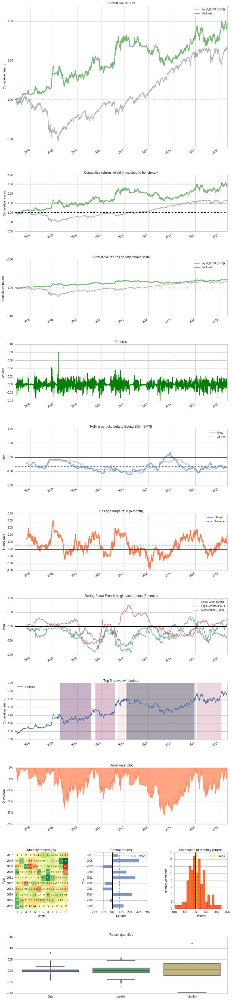

Stress Events,mean,min,max
Lehmann,0.11%,-1.30%,1.68%
US downgrade/European Debt Crisis,0.41%,-2.81%,3.71%
Fukushima,-0.04%,-0.36%,0.26%
EZB IR Event,-0.07%,-0.43%,0.16%
Aug07,0.14%,-1.64%,1.21%
Mar08,-0.03%,-3.35%,2.23%
Sept08,0.15%,-1.30%,1.68%
2009Q1,-0.13%,-2.93%,1.54%
2009Q2,-0.11%,-2.86%,8.08%
Flash Crash,0.01%,-0.42%,0.79%


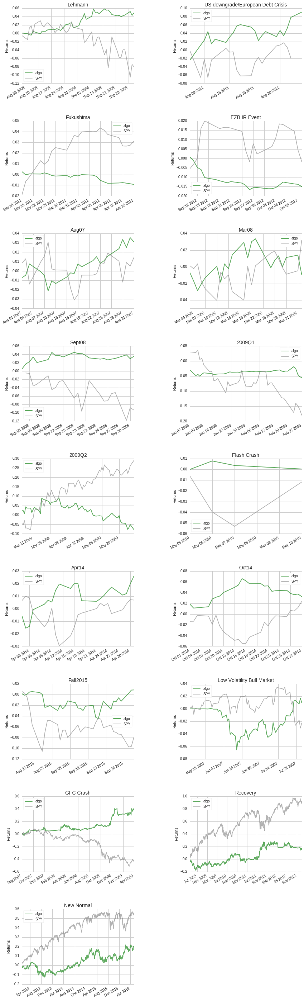

Top 10 long positions of all time,max
TYU13-1020201309,0.11%
TYH13-1020201303,0.11%
USU13-1022201309,0.11%
TYU09-1020200909,0.11%
TYH11-1020201103,0.11%
TYH08-1020200803,0.11%
USH11-1022201103,0.10%
USM12-1022201206,0.10%
TYH12-1020201203,0.10%
USH14-1022201403,0.10%


Top 10 short positions of all time,max
USZ12-1022201212,-0.05%
USH08-1022200803,-0.05%
TYM10-1020201006,-0.04%
USM11-1022201106,-0.04%
USU12-1022201209,-0.04%
USM07-1022200706,-0.04%
USZ10-1022201012,-0.04%
TYM11-1020201106,-0.04%
USM13-1022201306,-0.04%
USM12-1022201206,-0.04%


Top 10 positions of all time,max
TYU13-1020201309,0.11%
TYH13-1020201303,0.11%
USU13-1022201309,0.11%
TYU09-1020200909,0.11%
TYH11-1020201103,0.11%
TYH08-1020200803,0.11%
USH11-1022201103,0.10%
USM12-1022201206,0.10%
TYH12-1020201203,0.10%
USH14-1022201403,0.10%


All positions ever held,max
TYU13-1020201309,0.11%
TYH13-1020201303,0.11%
USU13-1022201309,0.11%
TYU09-1020200909,0.11%
TYH11-1020201103,0.11%
TYH08-1020200803,0.11%
USH11-1022201103,0.10%
USM12-1022201206,0.10%
TYH12-1020201203,0.10%
USH14-1022201403,0.10%


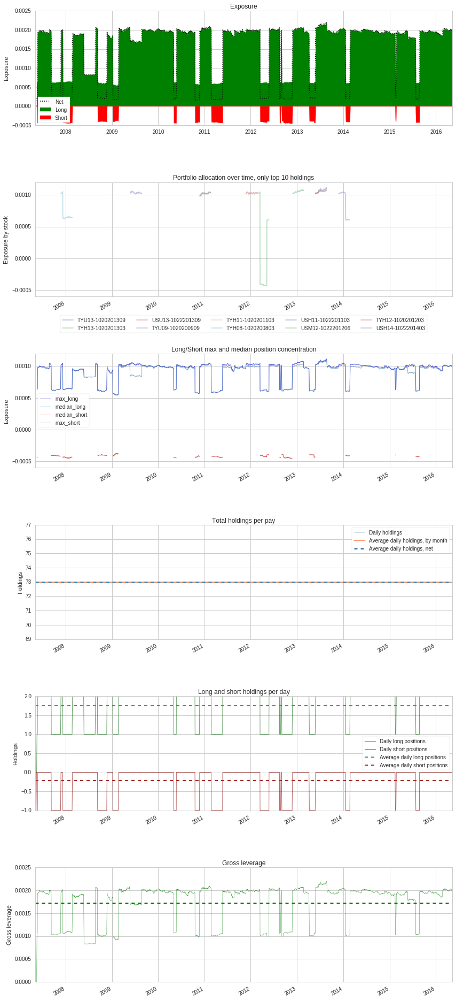

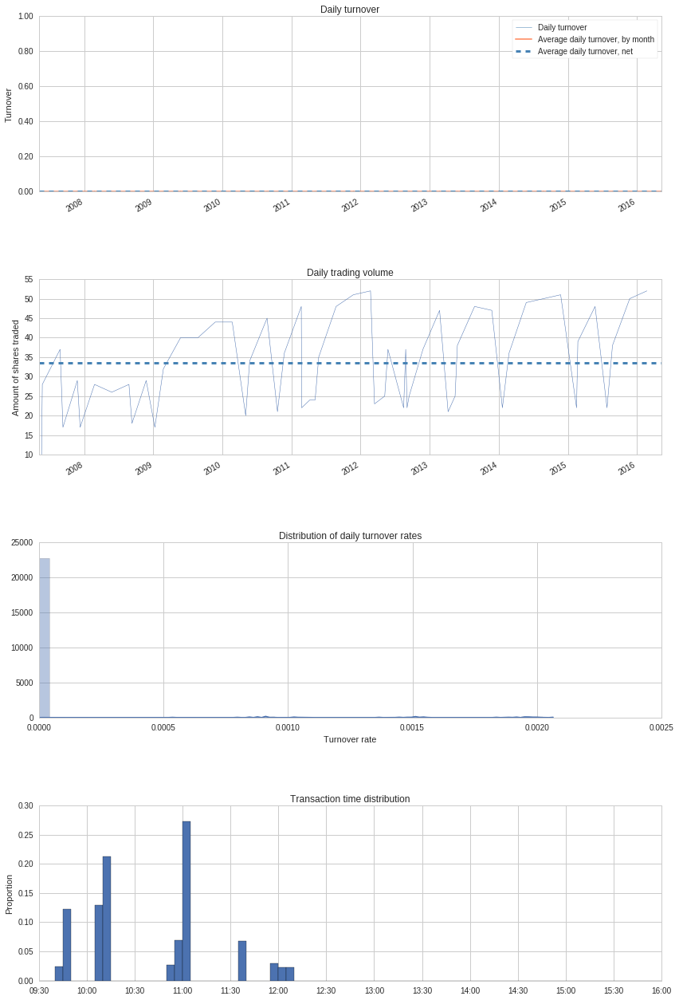

In [99]:
nob_rsi5_bt.create_full_tear_sheet()

### FITE Spread

The "NOB" Spread is the difference between the 5 & 10 yr UST that is a binary trade where a trader is betting that the yield curve will flatten or steepen. 

The default proportion is 3:2 (FV:TY)

- If you believe that the yield curve will "bull steepen" you sell the front 5 yr UST and buy the back 10 yr UST in a -1:3 ratio.

- If you believe that the yield curve will "bear flatten" you long the front 5 yr UST and sell the back 10 yr UST in a 3:-1.

https://tastytrade.com/tt/blog/fresh-trading-ideas-in-bond-futures

In [26]:
ty_future = continuous_future('TY', offset=0, roll='calendar', adjustment='mul')
ty_prices = history(ty_future, fields='price', start_date='2007-01-01', end_date='2017-05-01')
ty_prices.name = ty_future.root_symbol

fv_future = continuous_future('FV', offset=0, roll='calendar', adjustment='mul')
fv_prices = history(fv_future, fields='price', start_date='2007-01-01', end_date='2017-05-01')
fv_prices.name = fv_future.root_symbol

fite = pd.concat([ty_prices, fv_prices], axis=1)
fite = fite.dropna()
fite.head()

,TY,FV
2007-01-02 00:00:00+00:00,79.497,83.374
2007-01-03 00:00:00+00:00,79.624,83.461
2007-01-04 00:00:00+00:00,79.924,83.671
2007-01-05 00:00:00+00:00,79.716,83.498
2007-01-08 00:00:00+00:00,79.693,83.461


In [73]:
# FITE column calculation
fite['FITE'] = fv_prices / ty_prices
# FITE RSI 14 column
fite['RSI14'] = talib.RSI(fite.FITE, timeperiod=14)
fite['RSI5'] = talib.RSI(fite.FITE, timeperiod=5)
fite.tail()
#rsi_df = pd.DataFrame(rsi).dropna()

,TY,FV,FITE,RSI14,RSI5
2017-04-25 00:00:00+00:00,125.344,118.203,0.945253,48.289727,67.322313
2017-04-26 00:00:00+00:00,125.594,118.328,0.944373,44.381797,51.642513
2017-04-27 00:00:00+00:00,125.641,118.375,0.944393,44.496342,51.973607
2017-04-28 00:00:00+00:00,125.734,118.406,0.943933,42.418949,43.712854
2017-05-01 00:00:00+00:00,125.516,118.305,0.944777,47.278165,58.739902


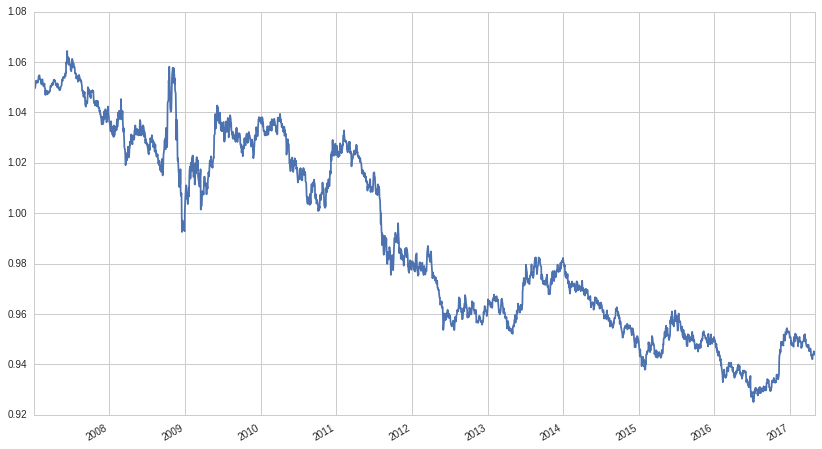

In [74]:
fite['FITE'].plot()
#plt.legend();
#plt.ylabel('NOB Spread')
#data2

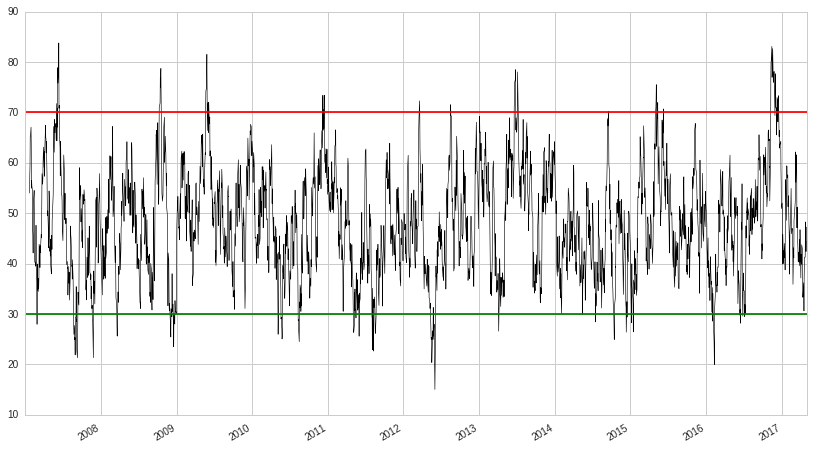

In [75]:
fite['RSI14'].plot(color='black', linewidth=.6)
plt.axhline(y=70, xmin=0, xmax=1, hold=None, color='red')
plt.axhline(y=30, xmin=0, xmax=1, hold=None, color='green')

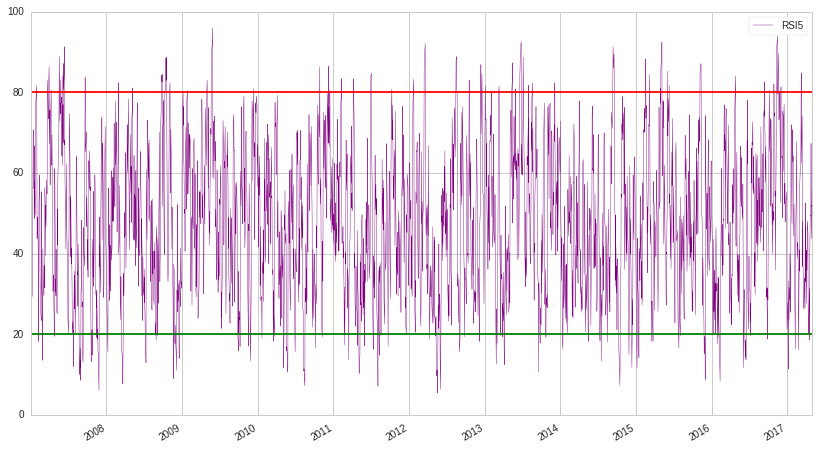

In [76]:
#fite['FITE'].plot()
fite['RSI5'].plot(color='purple', linewidth=.4)
plt.axhline(y=80, xmin=0, xmax=1, hold=None, color='red')
plt.axhline(y=20, xmin=0, xmax=1, hold=None, color='green')
plt.legend();

Hard to tell from the charts/plots if there is a tradeable RSI strategy here given small magnitude of the spread

Time to start backtesting the FITE

In [82]:
# RSI 30/70
fite_rsi14_bt = get_backtest('5939dd8d2479b96da3b5ba1f')

100% Time: 0:00:01|###########################################################|


In [77]:
# RSI 20/80
# with leverage 3:1 ratio
fite_rsi5_bt = get_backtest('5939dcbfd6b1024d4bff9e35')

100% Time: 0:00:00|###########################################################|


Entire data start date: 2007-08-01
Entire data end date: 2016-09-30


Backtest Months: 112


Performance statistics,Backtest
annual_return,0.09
cum_returns_final,1.27
annual_volatility,0.11
sharpe_ratio,0.86
calmar_ratio,0.68
stability_of_timeseries,0.90
max_drawdown,-0.13
omega_ratio,1.16
sortino_ratio,1.28
skew,0.21


Worst drawdown periods,net drawdown in %,peak date,valley date,recovery date,duration
0,13.48,2009-03-18,2009-06-08,2009-11-26,182
1,12.75,2010-11-04,2011-02-08,2011-06-23,166
2,11.01,2013-05-02,2013-09-05,2014-10-13,378
3,9.51,2008-03-17,2008-06-16,2008-09-15,131
4,9.18,2008-09-15,2008-10-14,2008-11-14,45




[-0.013 -0.027]


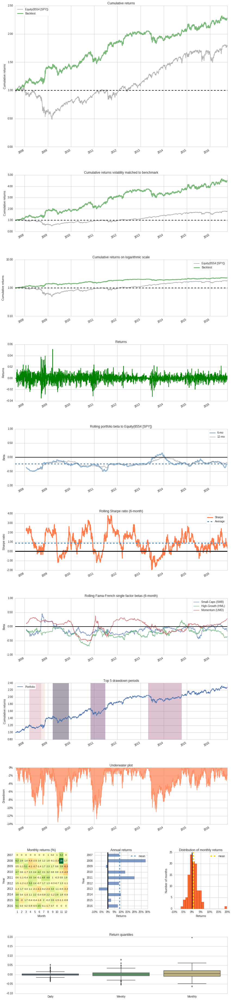

Stress Events,mean,min,max
Lehmann,0.06%,-3.55%,3.77%
US downgrade/European Debt Crisis,0.17%,-1.51%,1.76%
Fukushima,-0.04%,-0.88%,1.33%
EZB IR Event,0.02%,-1.04%,0.58%
Aug07,0.04%,-0.79%,1.06%
Mar08,-0.03%,-2.40%,1.50%
Sept08,0.04%,-3.55%,3.77%
2009Q1,-0.01%,-1.29%,1.26%
2009Q2,-0.07%,-2.02%,5.15%
Flash Crash,0.25%,-0.98%,1.27%


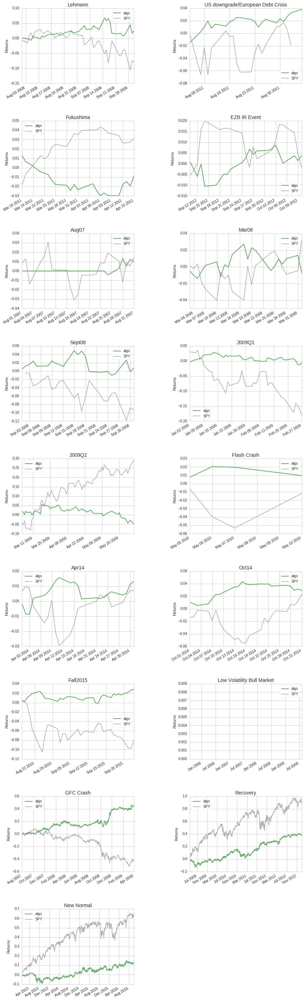

Top 10 long positions of all time,max
TYH11-1020201103,0.31%
TYZ08-1020200812,0.31%
TYU13-1020201309,0.31%
TYM09-1020200906,0.31%
TYM15-1020201506,0.30%
FVM12-1009201206,0.30%
FVM10-1009201006,0.30%
FVM11-1009201106,0.30%
FVH09-1009200903,0.30%
FVH16-1009201603,0.30%


Top 10 short positions of all time,max
FVU13-1009201309,-0.10%
TYM10-1020201006,-0.10%
FVM15-1009201506,-0.10%
FVM09-1009200906,-0.10%
FVH11-1009201103,-0.10%
TYM12-1020201206,-0.10%
FVM12-1009201206,-0.10%
FVU12-1009201209,-0.10%
FVZ08-1009200812,-0.10%
TYH09-1020200903,-0.10%


Top 10 positions of all time,max
TYH11-1020201103,0.31%
TYZ08-1020200812,0.31%
TYU13-1020201309,0.31%
TYM09-1020200906,0.31%
TYM15-1020201506,0.30%
FVM12-1009201206,0.30%
FVM10-1009201006,0.30%
FVM11-1009201106,0.30%
FVH09-1009200903,0.30%
FVH16-1009201603,0.30%


All positions ever held,max
TYH11-1020201103,0.31%
TYZ08-1020200812,0.31%
TYU13-1020201309,0.31%
TYM09-1020200906,0.31%
TYM15-1020201506,0.30%
FVM12-1009201206,0.30%
FVM10-1009201006,0.30%
FVM11-1009201106,0.30%
FVH09-1009200903,0.30%
FVH16-1009201603,0.30%


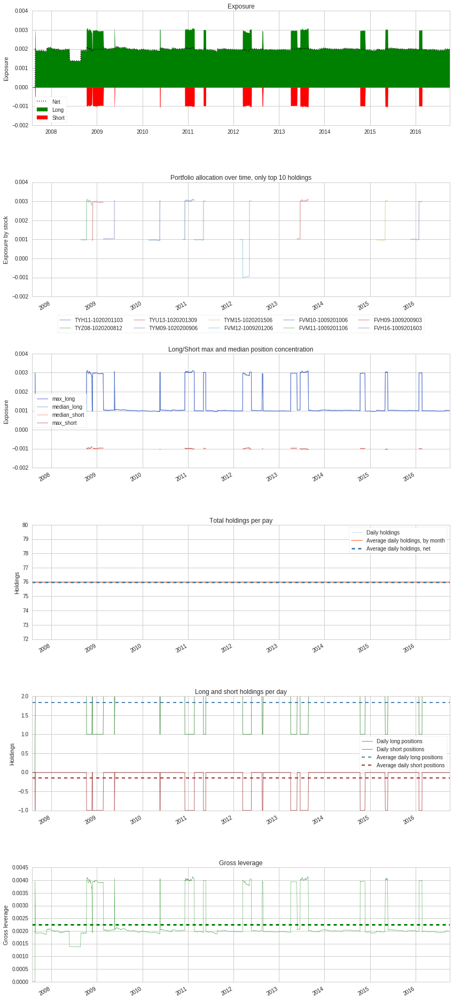

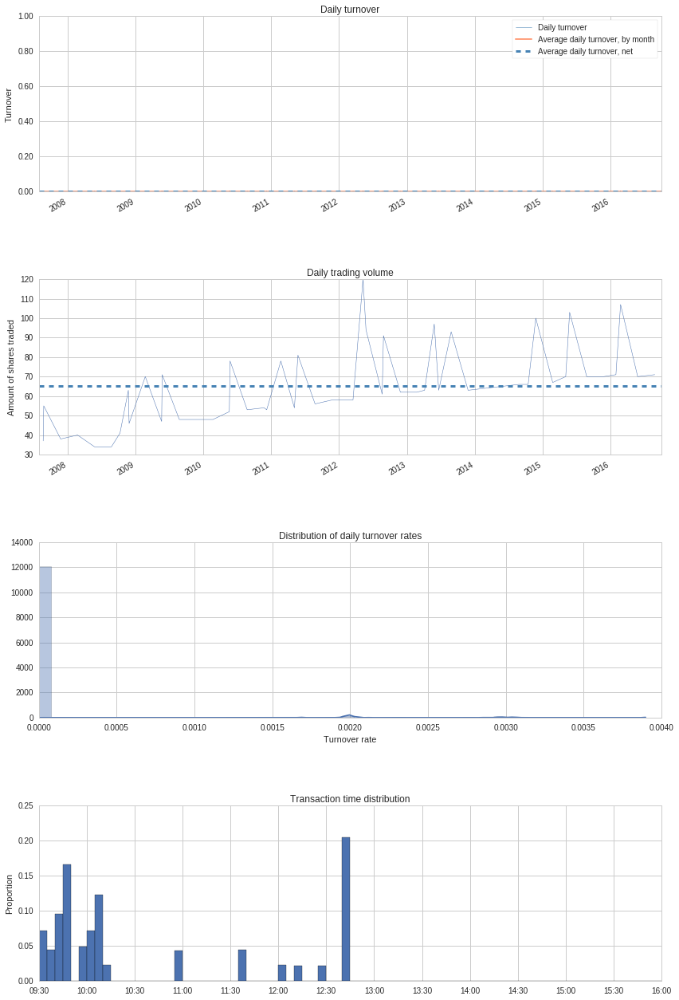

In [83]:
# RSI 20/80
fite_rsi14_bt.create_full_tear_sheet()

Entire data start date: 2007-08-01
Entire data end date: 2013-09-24


Backtest Months: 75


Performance statistics,Backtest
annual_return,0.12
cum_returns_final,0.99
annual_volatility,0.12
sharpe_ratio,0.95
calmar_ratio,0.74
stability_of_timeseries,0.94
max_drawdown,-0.16
omega_ratio,1.18
sortino_ratio,1.41
skew,0.12


Worst drawdown periods,net drawdown in %,peak date,valley date,recovery date,duration
0,15.62,2009-01-14,2009-06-08,2010-04-30,338
1,10.97,2010-11-04,2011-02-08,2011-05-06,132
2,10.39,2012-12-12,2013-09-05,NaT,NaN
3,9.14,2008-09-15,2008-10-14,2008-11-14,45
4,8.98,2008-03-17,2008-06-16,2008-09-15,131




[-0.015 -0.03 ]


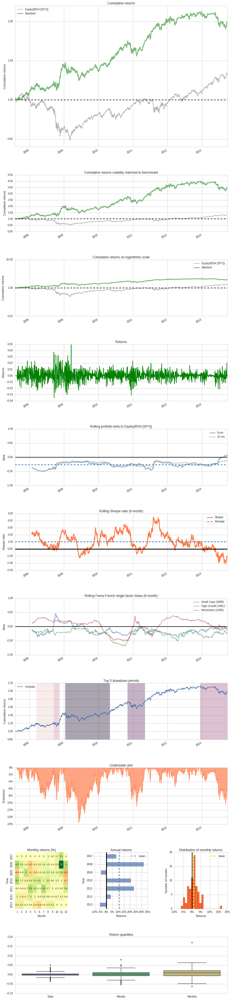

Stress Events,mean,min,max
Lehmann,0.06%,-3.53%,3.76%
US downgrade/European Debt Crisis,0.12%,-0.76%,0.80%
Fukushima,0.06%,-0.76%,1.57%
EZB IR Event,0.02%,-1.07%,0.60%
Aug07,0.04%,-0.79%,1.06%
Mar08,-0.03%,-2.41%,1.50%
Sept08,0.04%,-3.53%,3.76%
2009Q1,-0.12%,-3.05%,3.21%
2009Q2,-0.06%,-1.95%,5.00%
Flash Crash,0.25%,-0.98%,1.28%


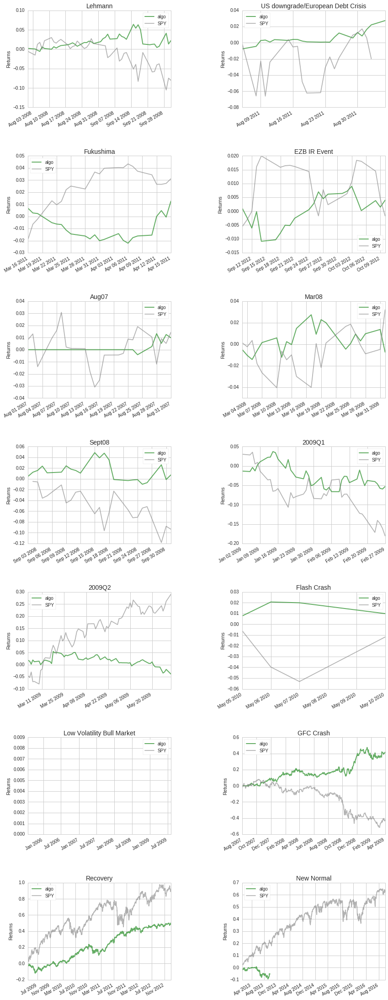

Top 10 long positions of all time,max
TYH09-1020200903,0.31%
TYH11-1020201103,0.31%
TYZ08-1020200812,0.31%
TYH13-1020201303,0.31%
TYZ07-1020200712,0.30%
TYM13-1020201306,0.30%
FVM12-1009201206,0.30%
FVU11-1009201109,0.30%
FVZ13-1009201312,0.30%
FVM13-1009201306,0.30%


Top 10 short positions of all time,max
FVH09-1009200903,-0.11%
FVH11-1009201103,-0.10%
FVU12-1009201209,-0.10%
FVH13-1009201303,-0.10%
TYZ09-1020200912,-0.10%
TYZ08-1020200812,-0.10%
TYZ10-1020201012,-0.10%
TYU11-1020201109,-0.10%
TYM11-1020201106,-0.10%
TYM13-1020201306,-0.10%


Top 10 positions of all time,max
TYH09-1020200903,0.31%
TYH11-1020201103,0.31%
TYZ08-1020200812,0.31%
TYH13-1020201303,0.31%
TYZ07-1020200712,0.30%
TYM13-1020201306,0.30%
FVM12-1009201206,0.30%
FVU11-1009201109,0.30%
FVZ13-1009201312,0.30%
FVM13-1009201306,0.30%


All positions ever held,max
TYH09-1020200903,0.31%
TYH11-1020201103,0.31%
TYZ08-1020200812,0.31%
TYH13-1020201303,0.31%
TYZ07-1020200712,0.30%
TYM13-1020201306,0.30%
FVM12-1009201206,0.30%
FVU11-1009201109,0.30%
FVZ13-1009201312,0.30%
FVM13-1009201306,0.30%


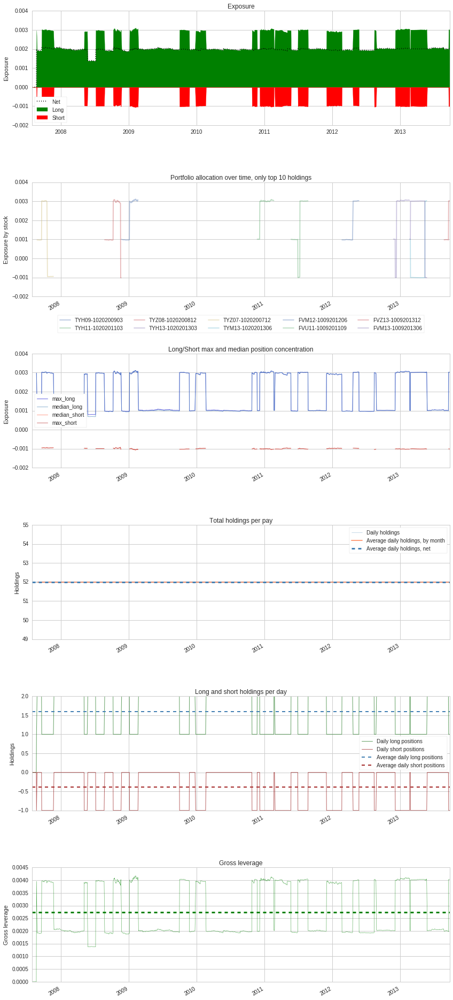

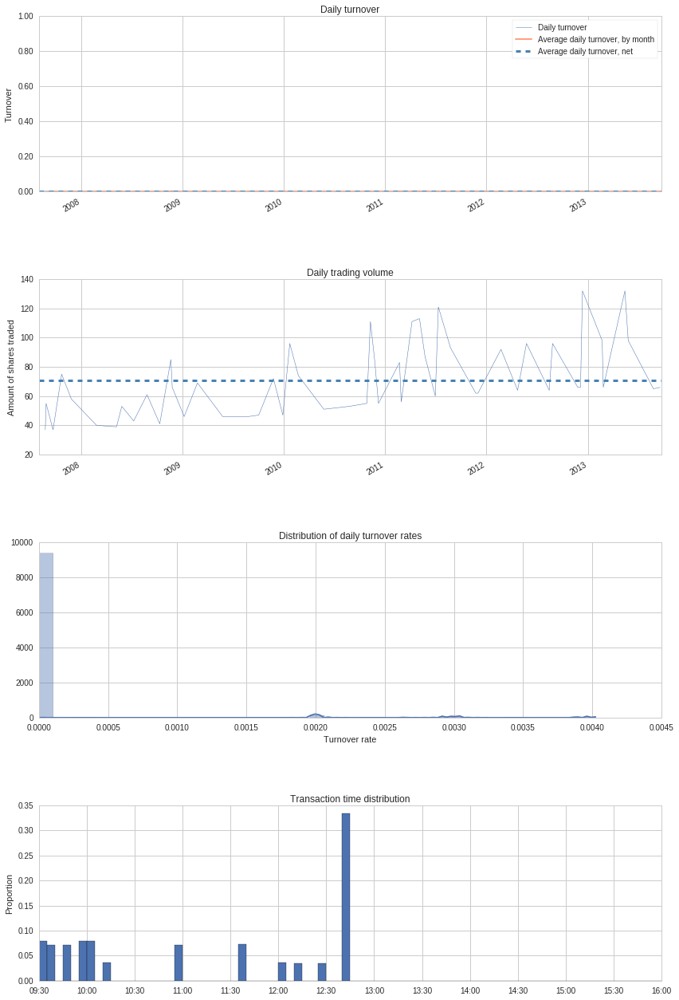

In [78]:
fite_rsi5_bt.create_full_tear_sheet()

###TUT Spread

The "TUT" Spread is the difference between the 2 & 10 yr UST that is a binary trade where a trader is betting that front end of the yield curve will flatten or steepen. 

The default proportion is 1:1 (TU:TY)

- If you believe that the yield curve will "bull steepen" you sell the front 2 yr UST and buy the back 10 yr UST contracts in a -1:1 ratio.

- If you believe that the yield curve will "bear flatten" you buy the front 2 yr UST and sell the 10 yr contracts in a 1:-1 ratio.

https://www.tastytrade.com/tt/shows/closing-the-gap-futures-edition/episodes/yield-curve-trade-ideas-03-17-2017?utm_campaign=archive&utm_medium=link&utm_source=social-share

In [60]:
ty_future = continuous_future('TY', offset=0, roll='calendar', adjustment='mul')
ty_prices = history(ty_future, fields='price', start_date='2007-01-01', end_date='2017-06-01')
ty_prices.name = ty_future.root_symbol

tu_future = continuous_future('TU', offset=0, roll='calendar', adjustment='mul')
tu_prices = history(tu_future, fields='price', start_date='2007-01-01', end_date='2017-06-01')
tu_prices.name = tu_future.root_symbol

tut = pd.concat([ty_prices, tu_prices], axis=1)
tut = tut.dropna()
tut.head()

,TY,TU
2007-01-02 00:00:00+00:00,79.310,93.763
2007-01-03 00:00:00+00:00,79.436,93.820
2007-01-04 00:00:00+00:00,79.736,93.921
2007-01-05 00:00:00+00:00,79.528,93.835
2007-01-08 00:00:00+00:00,79.505,93.777


In [67]:
# NOB column calculation
tut['TUT'] = tu_prices / ty_prices
# NOB RSI 14 column
tut['RSI14'] = talib.RSI(tut.TUT, timeperiod=14)
tut['RSI5'] = talib.RSI(tut.TUT, timeperiod=5)
tut.tail()
#rsi_df = pd.DataFrame(rsi).dropna()

,TY,TU,TUT,RSI14,RSI5
2017-05-26 00:00:00+00:00,125.891,108.203,0.859498,39.472428,33.847784
2017-05-29 00:00:00+00:00,125.984,108.211,0.858927,38.110369,29.455509
2017-05-30 00:00:00+00:00,126.188,108.227,0.857665,35.218211,21.683062
2017-05-31 00:00:00+00:00,126.234,108.227,0.857352,34.519426,20.045370
2017-06-01 00:00:00+00:00,126.234,108.203,0.857162,34.076479,18.956644


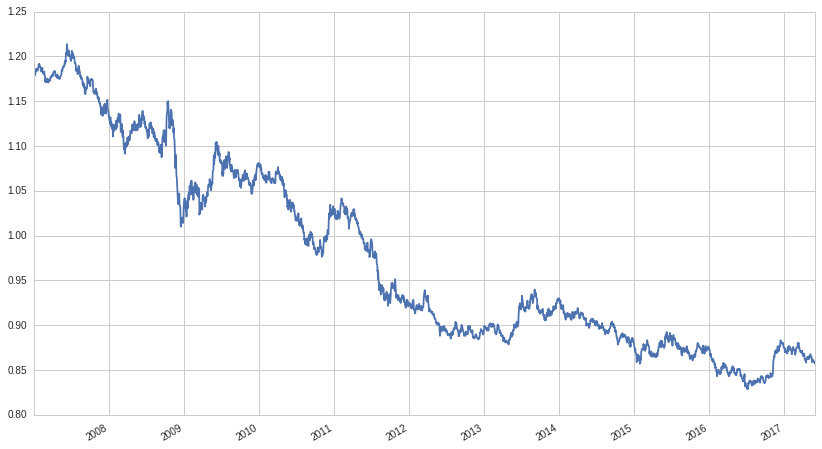

In [79]:
tut['TUT'].plot()
#plt.legend();
#plt.ylabel('NOB Spread')
#data2

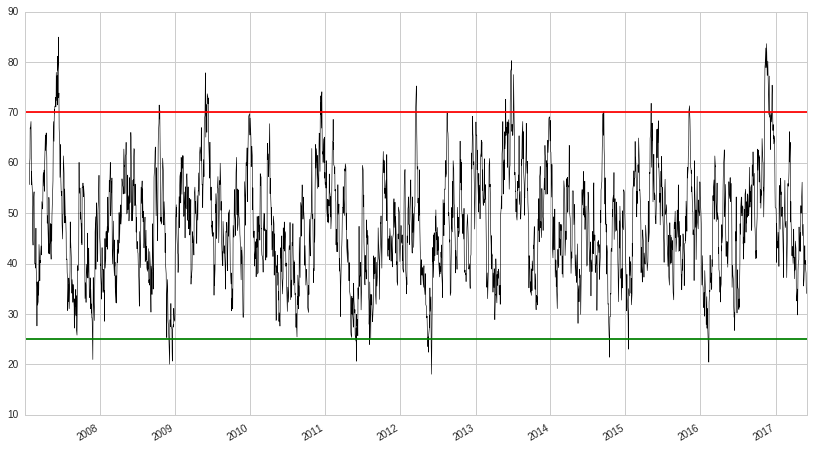

In [80]:
# TUT RSI 14
tut['RSI14'].plot(color='black', linewidth=.6)
plt.axhline(y=70, xmin=0, xmax=1, hold=None, color='red')
plt.axhline(y=25, xmin=0, xmax=1, hold=None, color='green')

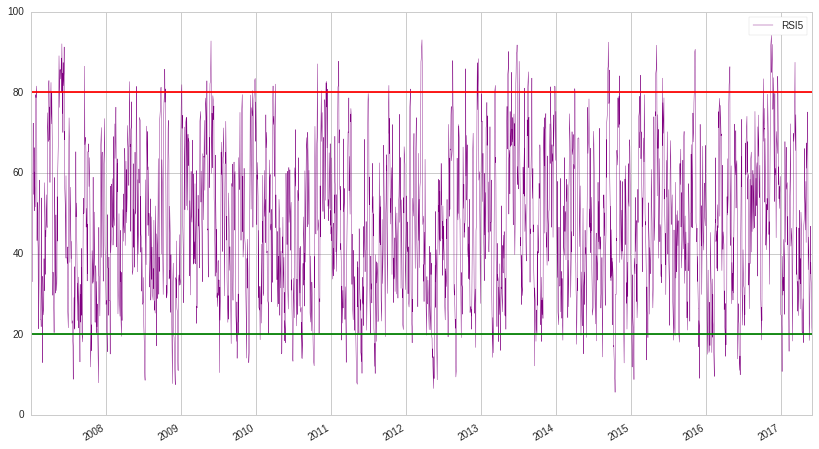

In [81]:
# TUT RSI 5
#tut['TUT'].plot()
tut['RSI5'].plot(color='purple', linewidth=.4)
plt.axhline(y=80, xmin=0, xmax=1, hold=None, color='red')
plt.axhline(y=20, xmin=0, xmax=1, hold=None, color='green')
plt.legend();

In [70]:
tut_rsi14_bt = get_backtest('5939d9791a60ec6983062c11')

100% Time: 0:00:01|###########################################################|


Entire data start date: 2007-01-02
Entire data end date: 2017-06-07


Backtest Months: 128


Performance statistics,Backtest
annual_return,0.05
cum_returns_final,0.62
annual_volatility,0.07
sharpe_ratio,0.70
calmar_ratio,0.57
stability_of_timeseries,0.89
max_drawdown,-0.08
omega_ratio,1.13
sortino_ratio,1.04
skew,0.34


Worst drawdown periods,net drawdown in %,peak date,valley date,recovery date,duration
0,8.18,2008-12-18,2009-06-10,2010-05-20,371
1,7.82,2016-07-05,2016-12-15,NaT,NaN
2,7.39,2013-05-02,2013-09-05,2014-10-15,380
3,7.36,2010-11-04,2011-02-08,2011-06-08,155
4,6.99,2008-03-17,2008-06-16,2008-09-15,131




[-0.008 -0.016]


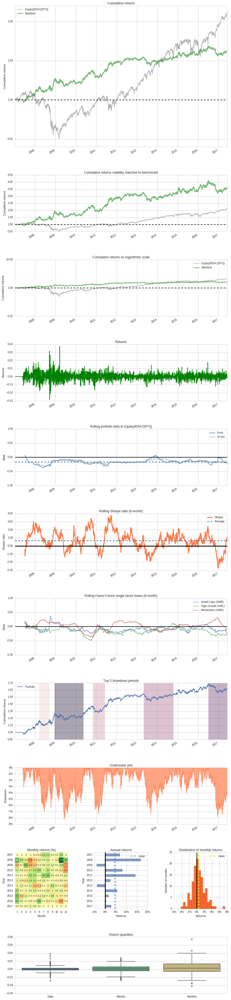

Stress Events,mean,min,max
Lehmann,0.05%,-2.85%,3.20%
US downgrade/European Debt Crisis,0.13%,-1.04%,1.34%
Fukushima,-0.02%,-0.57%,0.97%
EZB IR Event,0.01%,-0.79%,0.40%
Aug07,0.10%,-0.83%,1.03%
Mar08,-0.01%,-1.77%,1.16%
Sept08,0.04%,-2.85%,3.20%
2009Q1,-0.08%,-1.16%,1.08%
2009Q2,-0.04%,-1.12%,3.75%
Flash Crash,0.18%,-0.73%,0.99%


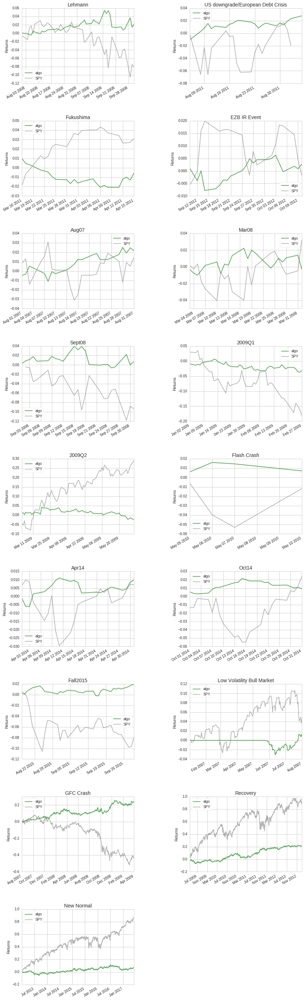

Top 10 long positions of all time,max
TYZ07-1020200712,0.11%
TYM10-1020201006,0.10%
TYH16-1020201603,0.10%
TYM16-1020201606,0.10%
TYU10-1020201009,0.10%
TYM08-1020200806,0.10%
TYU16-1020201609,0.10%
TYM13-1020201306,0.10%
TYU13-1020201309,0.10%
TYZ16-1020201612,0.10%


Top 10 short positions of all time,max
TUU09-1019200909,-0.06%
TUH10-1019201003,-0.05%
TUH09-1019200903,-0.05%
TUZ09-1019200912,-0.05%
TUM12-1019201206,-0.05%
TUU13-1019201309,-0.05%
TUM10-1019201006,-0.05%
TUH13-1019201303,-0.05%
TUH11-1019201103,-0.05%
TUM13-1019201306,-0.05%


Top 10 positions of all time,max
TYZ07-1020200712,0.11%
TYM10-1020201006,0.10%
TYH16-1020201603,0.10%
TYM16-1020201606,0.10%
TYU10-1020201009,0.10%
TYM08-1020200806,0.10%
TYU16-1020201609,0.10%
TYM13-1020201306,0.10%
TYU13-1020201309,0.10%
TYZ16-1020201612,0.10%


All positions ever held,max
TYZ07-1020200712,0.11%
TYM10-1020201006,0.10%
TYH16-1020201603,0.10%
TYM16-1020201606,0.10%
TYU10-1020201009,0.10%
TYM08-1020200806,0.10%
TYU16-1020201609,0.10%
TYM13-1020201306,0.10%
TYU13-1020201309,0.10%
TYZ16-1020201612,0.10%


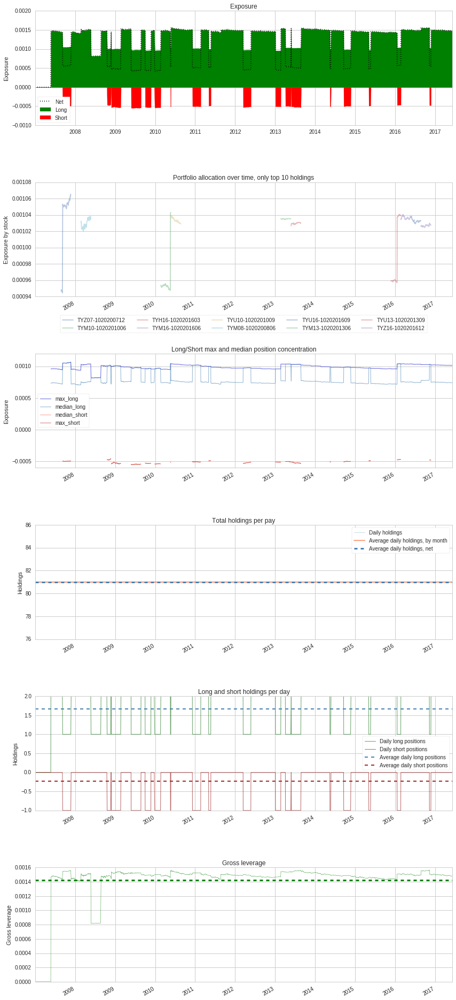

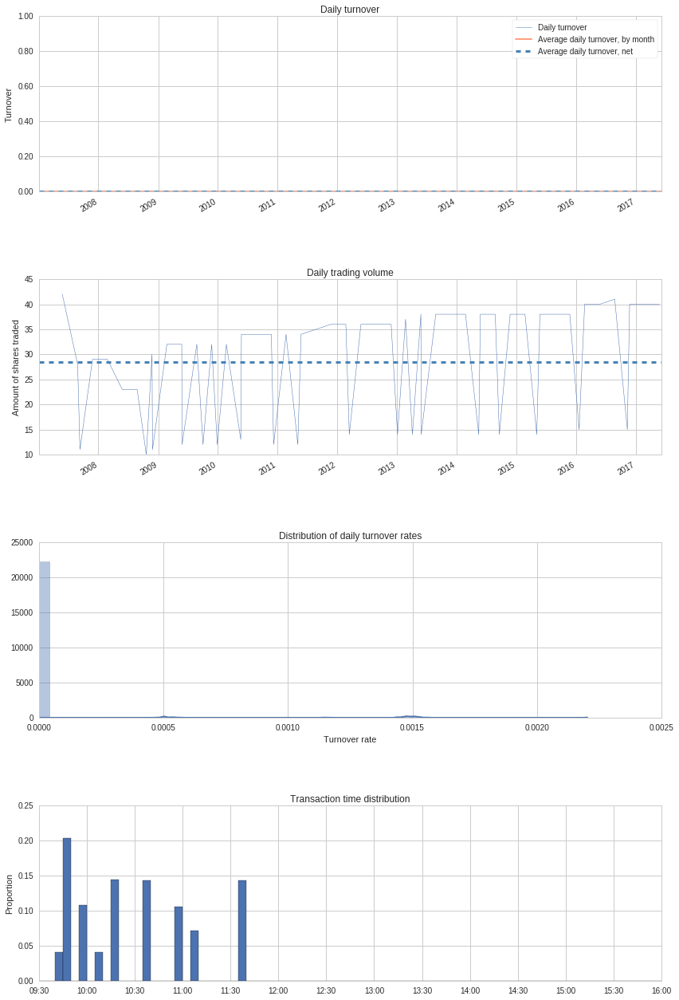

In [71]:
# RSI 30/70
# negligible leverage
tut_rsi14_bt.create_full_tear_sheet()

In [65]:
tut_rsi5_bt = get_backtest('5939d820d6b1024d4bff9dff')

100% Time: 0:00:01|###########################################################|


Entire data start date: 2007-01-02
Entire data end date: 2017-06-07


Backtest Months: 128


Performance statistics,Backtest
annual_return,0.05
cum_returns_final,0.74
annual_volatility,0.07
sharpe_ratio,0.77
calmar_ratio,0.55
stability_of_timeseries,0.86
max_drawdown,-0.10
omega_ratio,1.15
sortino_ratio,1.14
skew,0.27


Worst drawdown periods,net drawdown in %,peak date,valley date,recovery date,duration
0,9.75,2008-12-18,2009-06-08,2009-11-26,246
1,7.74,2016-07-05,2016-12-15,NaT,NaN
2,7.61,2010-11-04,2011-02-08,2011-06-08,155
3,7.42,2013-05-02,2013-09-05,2014-12-10,420
4,6.91,2008-03-17,2008-06-16,2008-09-15,131




[-0.009 -0.017]


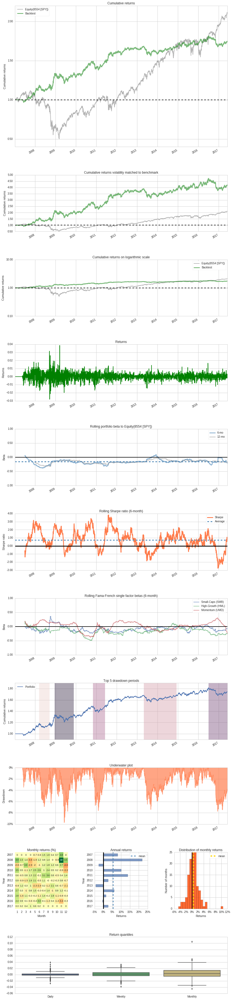

Stress Events,mean,min,max
Lehmann,0.05%,-2.81%,3.16%
US downgrade/European Debt Crisis,0.13%,-1.04%,1.35%
Fukushima,-0.02%,-0.38%,0.71%
EZB IR Event,0.01%,-0.73%,0.35%
Aug07,0.08%,-0.60%,0.76%
Mar08,-0.01%,-1.75%,1.15%
Sept08,0.04%,-2.81%,3.16%
2009Q1,-0.08%,-1.31%,1.50%
2009Q2,-0.03%,-1.31%,3.87%
Flash Crash,0.18%,-0.74%,0.99%


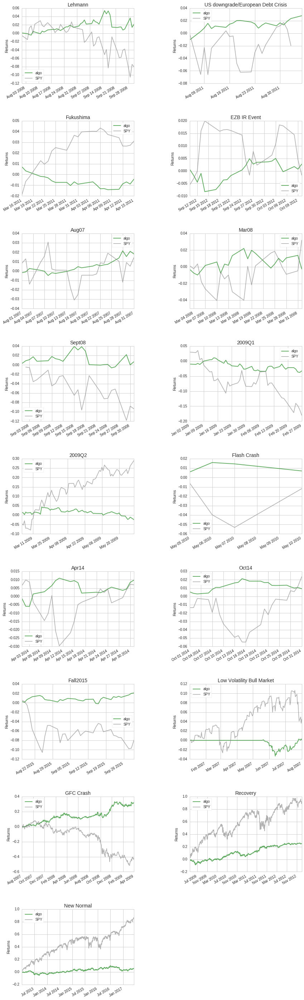

Top 10 long positions of all time,max
TYH08-1020200803,0.11%
TYU10-1020201009,0.10%
TYH16-1020201603,0.10%
TYM16-1020201606,0.10%
TYM09-1020200906,0.10%
TYZ15-1020201512,0.10%
TYM13-1020201306,0.10%
TYU09-1020200909,0.10%
TYZ16-1020201612,0.10%
TYZ10-1020201012,0.10%


Top 10 short positions of all time,max
TUH13-1019201303,-0.05%
TUZ12-1019201212,-0.05%
TUM11-1019201106,-0.05%
TUM13-1019201306,-0.05%
TUZ14-1019201412,-0.05%
TUZ10-1019201012,-0.05%
TUH15-1019201503,-0.05%
TUZ15-1019201512,-0.05%
TUU07-1019200709,-0.05%
TUH16-1019201603,-0.05%


Top 10 positions of all time,max
TYH08-1020200803,0.11%
TYU10-1020201009,0.10%
TYH16-1020201603,0.10%
TYM16-1020201606,0.10%
TYM09-1020200906,0.10%
TYZ15-1020201512,0.10%
TYM13-1020201306,0.10%
TYU09-1020200909,0.10%
TYZ16-1020201612,0.10%
TYZ10-1020201012,0.10%


All positions ever held,max
TYH08-1020200803,0.11%
TYU10-1020201009,0.10%
TYH16-1020201603,0.10%
TYM16-1020201606,0.10%
TYM09-1020200906,0.10%
TYZ15-1020201512,0.10%
TYM13-1020201306,0.10%
TYU09-1020200909,0.10%
TYZ16-1020201612,0.10%
TYZ10-1020201012,0.10%


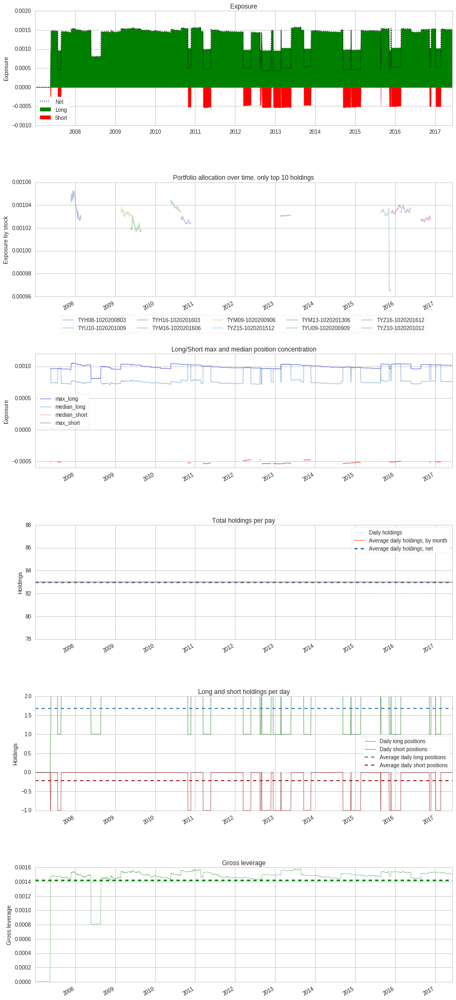

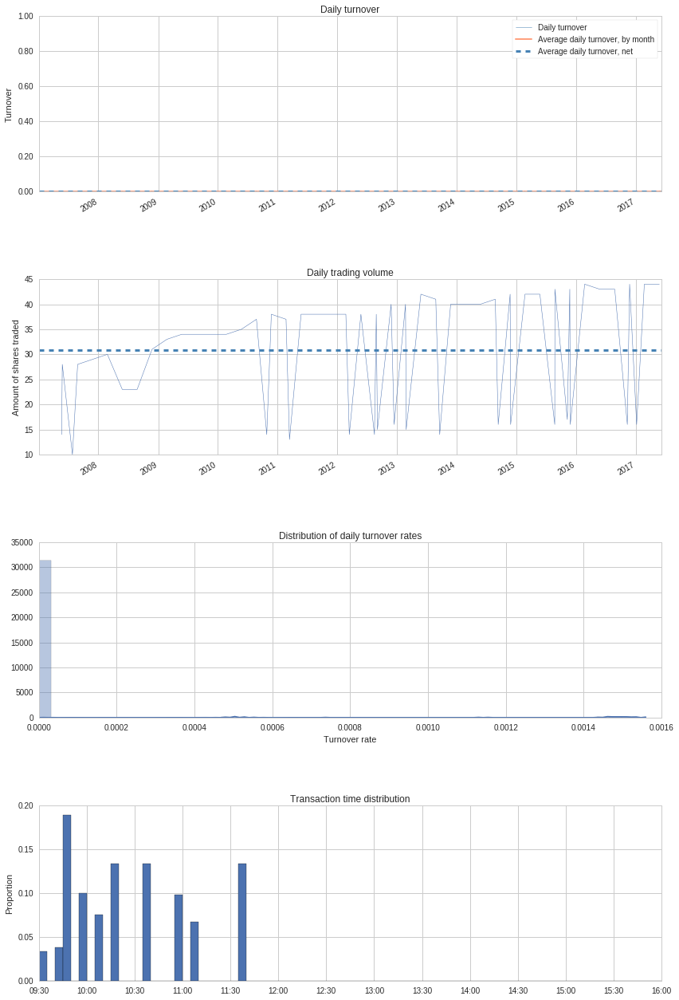

In [66]:
# RSI 18/85
# negligible leverage
tut_rsi5_bt.create_full_tear_sheet()